# **Pre-trained ResNet-50 model trained on the KDEF dataset with input image resolution of 56x56.**

In [1]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 2.1 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
from torch.utils.data import Dataset
import os
import copy
from tensorboardX import SummaryWriter
from PIL import Image
import torchvision.transforms as transforms
import random
plt.ion()   # interactive mode
%matplotlib inline

In [3]:
# Set fixed seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [4]:
from zipfile import ZipFile
import os

zip_path = '/content/KEDF_downsample_56x56.zip'

extract_to = '/content'

os.makedirs(extract_to, exist_ok=True)

with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'✅ Files extracted to: {extract_to}')

✅ Files extracted to: /content


In [5]:
import os

classes = {
    "AF": 0, "AN": 1, "DI": 2, "HA": 3, "NE": 4, "SA": 5, "SU": 6
}

root='/content/KEDF_downsample_56x56'
invalid_files = []

for path, subdirs, files in os.walk(root):
    for name in files:
        if len(name) >= 6:
            emotion_code = name[4:6]
            if emotion_code not in classes:
                invalid_files.append(os.path.join(path, name))

# Print the problematic files
print("Found {} problematic files:".format(len(invalid_files)))
for file in invalid_files:
    print(file)

Found 0 problematic files:


In [6]:
class KDEFDataset(Dataset):
    def __init__(self, root='/content/KEDF_downsample_56x56', transforms_=None, idx=[]):
        self.transform = transforms_
        self.files = []

        for path, subdirs, files in os.walk(root):
            for name in files:
                self.files.append(os.path.join(path, name))

        self.files =  [self.files[i] for i in idx]
        self.classes = {
             "AF":0,
             "AN":1,
             "DI":2,
             "HA":3,
             "NE":4,
             "SA":5,
             "SU":6
        }
        for f in self.files:
          name = f.split('/')[-1]
          emotion_code = name[4:6]
          if emotion_code not in self.classes:
              print(f"Invalid file: {f} (code: {emotion_code})")

        for index in range(4900):
            filepath = self.files[index % len(self.files)]
            filename = filepath.split('/')[-1]
            if filename[4:6] not in self.classes:
                print(filepath)

    def __getitem__(self, index):
        filepath = self.files[index % len(self.files)]

        filename = filepath.split('/')[-1]
        img = self.transform(Image.open(filepath))
        label = self.classes[filename[4:6]]

        return img, label

    def __len__(self):
        return len(self.files)

Load Data
---------


In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

idx = np.random.permutation(4900)
idx = {'val': idx[0:490], 'train': idx[490:]}

g = torch.Generator()
g.manual_seed(42)

dataloaders = {
    x: torch.utils.data.DataLoader(
        KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
        batch_size=32,
        shuffle=True,
        generator=g
    )
    for x in ['train', 'val']
}

dataset_sizes = {x: len(idx[x]) for x in ['train', 'val']}
class_names = 7

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Visualize a few images


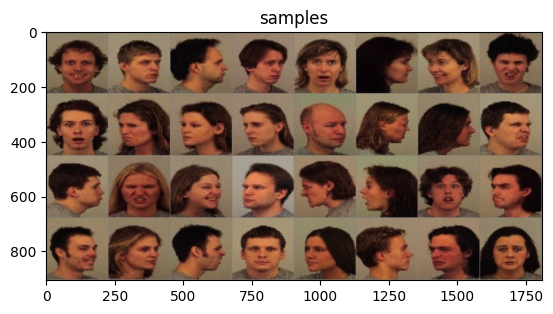

In [8]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title='samples')

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [9]:
from tqdm import tqdm

def train_model(model, criterion, optimizer, scheduler, dataloaders, writer=None, i=0,  num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))


            writer.add_scalar(phase+"/loss", epoch_loss, epoch)
            writer.add_scalar(phase+"/acc", epoch_acc, epoch)


            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                torch.save(model.state_dict(), 'saved/resnet_'+str(i)+'.pt')

        print()


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, best_acc

Visualizing the model predictions

In [13]:
import imageio
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

def visualize_model_misclassified(model, dataloader, class_names, save_dir='misclassified', num_images=15, columns=3):
    os.makedirs(save_dir, exist_ok=True)
    was_training = model.training
    model.eval()
    images_so_far = 0
    rows = (num_images + columns - 1) // columns
    fig, axes = plt.subplots(rows, columns, figsize=(columns * 4, rows * 4))
    axes = axes.flatten()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                if preds[j] != labels[j]:
                    if images_so_far >= num_images:
                        break

                    # --- Display in grid ---
                    ax = axes[images_so_far]
                    ax.axis('off')
                    ax.set_title(f'Pred: {class_names[int(preds[j])]},\nTrue: {class_names[int(labels[j])]}', fontsize=9)
                    imshow(inputs.cpu().data[j], ax=ax)

                    # --- Save image with overlay text ---
                    img = inputs[j].cpu().numpy().transpose(1, 2, 0)
                    img = (img * 0.5 + 0.5) * 255
                    img = img.astype(np.uint8)
                    img_pil = Image.fromarray(img)

                    draw = ImageDraw.Draw(img_pil)
                    font = ImageFont.load_default()
                    text = f'Predicted: {class_names[int(preds[j])]} | True: {class_names[int(labels[j])]}'
                    draw.rectangle([10, 10, 280, 25], fill=(255, 255, 255))
                    draw.text((10, 10), text, font=font, fill=(0, 0, 0))

                    img_pil.save(f'{save_dir}/misclassified_{images_so_far + 1}.jpg')

                    images_so_far += 1

    for k in range(images_so_far, len(axes)):
        axes[k].axis('off')

    plt.tight_layout()
    plt.show()
    model.train(mode=was_training)



def imshow(inp, ax=None, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    if ax is None:
        plt.imshow(inp)
    else:
        ax.imshow(inp)
    if title is not None:
        ax.set_title(title)


Finetuning the convnet
----------------------

Load a pretrained model and reset final fully connected layer.




Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.24it/s]


train Loss: 1.7022 Acc: 0.3147


100%|██████████| 16/16 [00:00<00:00, 17.58it/s]


val Loss: 1.1425 Acc: 0.5531

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.18it/s]


train Loss: 0.9229 Acc: 0.6528


100%|██████████| 16/16 [00:00<00:00, 17.51it/s]


val Loss: 0.8154 Acc: 0.6980

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.21it/s]


train Loss: 0.5632 Acc: 0.7941


100%|██████████| 16/16 [00:00<00:00, 17.64it/s]


val Loss: 0.7946 Acc: 0.6959

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.22it/s]


train Loss: 0.3912 Acc: 0.8655


100%|██████████| 16/16 [00:00<00:00, 17.52it/s]


val Loss: 0.5507 Acc: 0.8020

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.21it/s]


train Loss: 0.2638 Acc: 0.9091


100%|██████████| 16/16 [00:00<00:00, 17.69it/s]


val Loss: 0.4974 Acc: 0.8204

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.20it/s]


train Loss: 0.1461 Acc: 0.9574


100%|██████████| 16/16 [00:00<00:00, 16.95it/s]


val Loss: 0.3572 Acc: 0.8633

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.26it/s]


train Loss: 0.1170 Acc: 0.9701


100%|██████████| 16/16 [00:00<00:00, 17.62it/s]


val Loss: 0.3506 Acc: 0.8776

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.29it/s]


train Loss: 0.1016 Acc: 0.9764


100%|██████████| 16/16 [00:00<00:00, 17.77it/s]


val Loss: 0.3355 Acc: 0.8735

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.28it/s]


train Loss: 0.0966 Acc: 0.9757


100%|██████████| 16/16 [00:00<00:00, 17.69it/s]


val Loss: 0.3306 Acc: 0.8796

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.23it/s]


train Loss: 0.0801 Acc: 0.9814


100%|██████████| 16/16 [00:00<00:00, 17.79it/s]


val Loss: 0.3563 Acc: 0.8796

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.26it/s]


train Loss: 0.0746 Acc: 0.9830


100%|██████████| 16/16 [00:00<00:00, 17.23it/s]


val Loss: 0.3412 Acc: 0.8776

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.28it/s]


train Loss: 0.0686 Acc: 0.9848


100%|██████████| 16/16 [00:00<00:00, 17.09it/s]


val Loss: 0.3179 Acc: 0.8816

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.18it/s]


train Loss: 0.0653 Acc: 0.9873


100%|██████████| 16/16 [00:00<00:00, 16.77it/s]


val Loss: 0.3187 Acc: 0.8796

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.30it/s]


train Loss: 0.0700 Acc: 0.9844


100%|██████████| 16/16 [00:00<00:00, 17.58it/s]


val Loss: 0.3314 Acc: 0.8755

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.30it/s]


train Loss: 0.0706 Acc: 0.9834


100%|██████████| 16/16 [00:00<00:00, 17.44it/s]


val Loss: 0.3312 Acc: 0.8735

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.23it/s]


train Loss: 0.0634 Acc: 0.9871


100%|██████████| 16/16 [00:00<00:00, 17.45it/s]


val Loss: 0.3084 Acc: 0.8878

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.25it/s]


train Loss: 0.0647 Acc: 0.9853


100%|██████████| 16/16 [00:00<00:00, 17.73it/s]


val Loss: 0.3200 Acc: 0.8776

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.25it/s]


train Loss: 0.0655 Acc: 0.9853


100%|██████████| 16/16 [00:00<00:00, 17.72it/s]


val Loss: 0.3237 Acc: 0.8816

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.24it/s]


train Loss: 0.0593 Acc: 0.9907


100%|██████████| 16/16 [00:00<00:00, 16.64it/s]


val Loss: 0.3439 Acc: 0.8816

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.20it/s]


train Loss: 0.0640 Acc: 0.9857


100%|██████████| 16/16 [00:00<00:00, 17.49it/s]


val Loss: 0.3336 Acc: 0.8755

Training complete in 4m 26s
Best val Acc: 0.887755
Showing misclassified examples for fold 0...


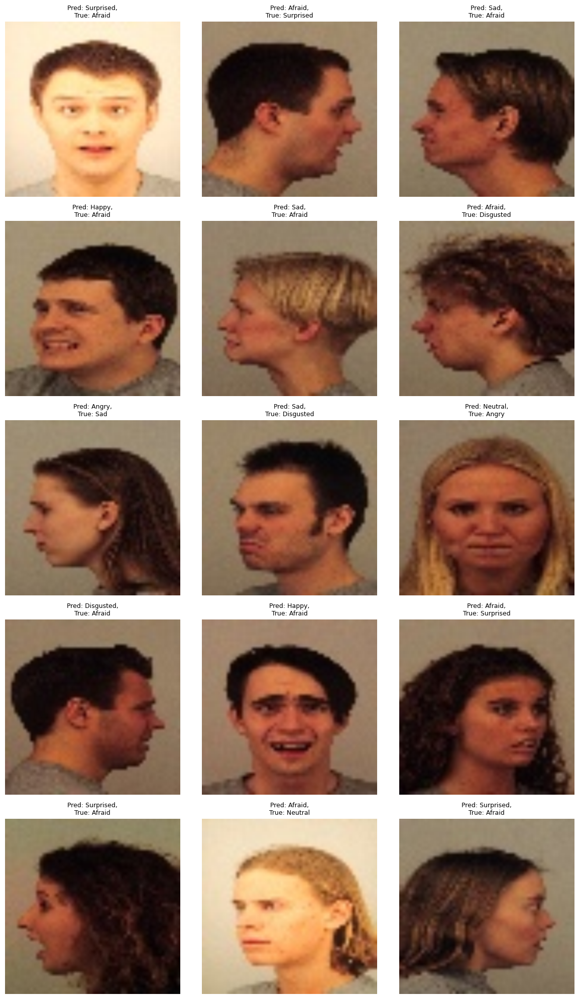




------------------------------------
 Accuracies  [0.8877551020408164]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 1.6989 Acc: 0.3311


100%|██████████| 16/16 [00:00<00:00, 17.36it/s]


val Loss: 1.3312 Acc: 0.4735

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.11it/s]


train Loss: 0.8855 Acc: 0.6791


100%|██████████| 16/16 [00:00<00:00, 17.22it/s]


val Loss: 0.6839 Acc: 0.7163

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.07it/s]


train Loss: 0.5079 Acc: 0.8238


100%|██████████| 16/16 [00:00<00:00, 17.00it/s]


val Loss: 0.5237 Acc: 0.8122

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.03it/s]


train Loss: 0.3474 Acc: 0.8769


100%|██████████| 16/16 [00:00<00:00, 16.94it/s]


val Loss: 0.4529 Acc: 0.8469

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.10it/s]


train Loss: 0.2315 Acc: 0.9204


100%|██████████| 16/16 [00:00<00:00, 17.10it/s]


val Loss: 0.4295 Acc: 0.8306

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.15it/s]


train Loss: 0.1296 Acc: 0.9653


100%|██████████| 16/16 [00:00<00:00, 16.43it/s]


val Loss: 0.2879 Acc: 0.9020

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.07it/s]


train Loss: 0.1026 Acc: 0.9719


100%|██████████| 16/16 [00:00<00:00, 17.08it/s]


val Loss: 0.2739 Acc: 0.9041

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.10it/s]


train Loss: 0.0847 Acc: 0.9789


100%|██████████| 16/16 [00:00<00:00, 17.40it/s]


val Loss: 0.2757 Acc: 0.9020

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.17it/s]


train Loss: 0.0803 Acc: 0.9819


100%|██████████| 16/16 [00:01<00:00, 15.94it/s]


val Loss: 0.2653 Acc: 0.9061

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.05it/s]


train Loss: 0.0694 Acc: 0.9866


100%|██████████| 16/16 [00:00<00:00, 17.36it/s]


val Loss: 0.2794 Acc: 0.9000

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.04it/s]


train Loss: 0.0628 Acc: 0.9873


100%|██████████| 16/16 [00:00<00:00, 17.30it/s]


val Loss: 0.2697 Acc: 0.9082

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.09it/s]


train Loss: 0.0566 Acc: 0.9896


100%|██████████| 16/16 [00:00<00:00, 17.50it/s]


val Loss: 0.2676 Acc: 0.9061

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.12it/s]


train Loss: 0.0594 Acc: 0.9864


100%|██████████| 16/16 [00:00<00:00, 17.05it/s]


val Loss: 0.2717 Acc: 0.9020

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.07it/s]


train Loss: 0.0614 Acc: 0.9859


100%|██████████| 16/16 [00:00<00:00, 17.32it/s]


val Loss: 0.2640 Acc: 0.9102

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.0599 Acc: 0.9882


100%|██████████| 16/16 [00:00<00:00, 17.19it/s]


val Loss: 0.2605 Acc: 0.9102

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.04it/s]


train Loss: 0.0594 Acc: 0.9864


100%|██████████| 16/16 [00:00<00:00, 17.14it/s]


val Loss: 0.2690 Acc: 0.9102

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.05it/s]


train Loss: 0.0568 Acc: 0.9896


100%|██████████| 16/16 [00:00<00:00, 17.30it/s]


val Loss: 0.2618 Acc: 0.9143

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.09it/s]


train Loss: 0.0592 Acc: 0.9880


100%|██████████| 16/16 [00:00<00:00, 17.20it/s]


val Loss: 0.2635 Acc: 0.9102

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.11it/s]


train Loss: 0.0576 Acc: 0.9889


100%|██████████| 16/16 [00:00<00:00, 17.42it/s]


val Loss: 0.2676 Acc: 0.9082

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.06it/s]


train Loss: 0.0563 Acc: 0.9889


100%|██████████| 16/16 [00:00<00:00, 17.09it/s]


val Loss: 0.2628 Acc: 0.9041

Training complete in 4m 31s
Best val Acc: 0.914286
Showing misclassified examples for fold 1...


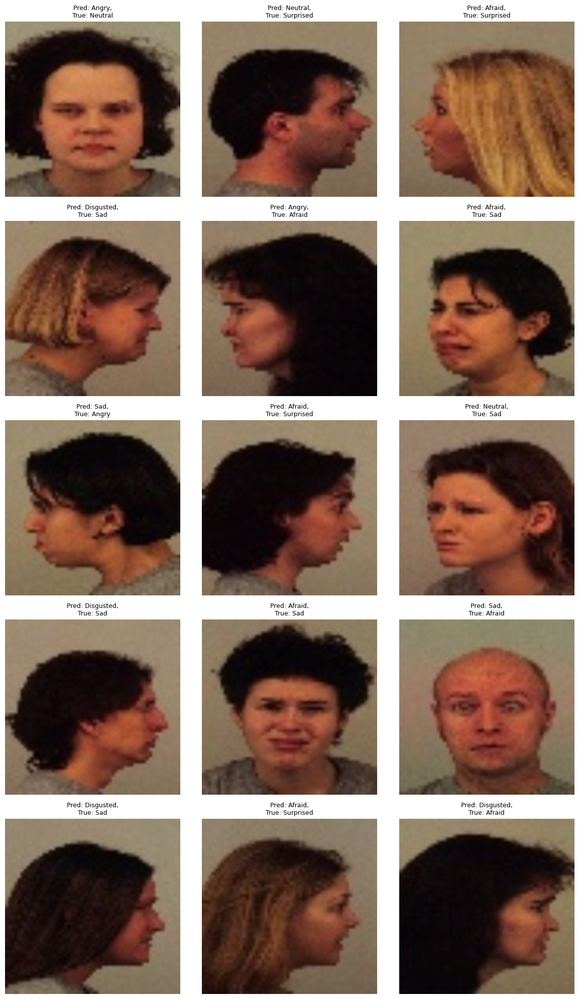




------------------------------------
 Accuracies  [0.8877551020408164, 0.9142857142857144]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.88it/s]


train Loss: 1.7219 Acc: 0.3073


100%|██████████| 16/16 [00:00<00:00, 16.84it/s]


val Loss: 1.2122 Acc: 0.5449

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.9190 Acc: 0.6567


100%|██████████| 16/16 [00:00<00:00, 17.43it/s]


val Loss: 0.8024 Acc: 0.6939

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.5461 Acc: 0.8075


100%|██████████| 16/16 [00:00<00:00, 17.34it/s]


val Loss: 0.5533 Acc: 0.7959

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.00it/s]


train Loss: 0.3557 Acc: 0.8764


100%|██████████| 16/16 [00:00<00:00, 16.84it/s]


val Loss: 0.6812 Acc: 0.7469

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.2496 Acc: 0.9150


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.6221 Acc: 0.7612

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.87it/s]


train Loss: 0.1370 Acc: 0.9619


100%|██████████| 16/16 [00:00<00:00, 16.28it/s]


val Loss: 0.3267 Acc: 0.8735

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.02it/s]


train Loss: 0.1111 Acc: 0.9712


100%|██████████| 16/16 [00:00<00:00, 16.19it/s]


val Loss: 0.3298 Acc: 0.8776

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.87it/s]


train Loss: 0.0984 Acc: 0.9764


100%|██████████| 16/16 [00:01<00:00, 15.76it/s]


val Loss: 0.3197 Acc: 0.8816

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.83it/s]


train Loss: 0.0872 Acc: 0.9798


100%|██████████| 16/16 [00:00<00:00, 16.81it/s]


val Loss: 0.3201 Acc: 0.8796

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.0780 Acc: 0.9832


100%|██████████| 16/16 [00:01<00:00, 15.61it/s]


val Loss: 0.3333 Acc: 0.8857

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.92it/s]


train Loss: 0.0734 Acc: 0.9857


100%|██████████| 16/16 [00:00<00:00, 17.54it/s]


val Loss: 0.3237 Acc: 0.8959

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.89it/s]


train Loss: 0.0691 Acc: 0.9864


100%|██████████| 16/16 [00:00<00:00, 16.64it/s]


val Loss: 0.3230 Acc: 0.8837

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.89it/s]


train Loss: 0.0638 Acc: 0.9864


100%|██████████| 16/16 [00:01<00:00, 15.99it/s]


val Loss: 0.3294 Acc: 0.8816

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.05it/s]


train Loss: 0.0626 Acc: 0.9896


100%|██████████| 16/16 [00:00<00:00, 16.76it/s]


val Loss: 0.3233 Acc: 0.8918

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.02it/s]


train Loss: 0.0634 Acc: 0.9887


100%|██████████| 16/16 [00:00<00:00, 17.13it/s]


val Loss: 0.3314 Acc: 0.8837

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.04it/s]


train Loss: 0.0603 Acc: 0.9900


100%|██████████| 16/16 [00:01<00:00, 15.85it/s]


val Loss: 0.3354 Acc: 0.8878

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.08it/s]


train Loss: 0.0584 Acc: 0.9896


100%|██████████| 16/16 [00:00<00:00, 17.16it/s]


val Loss: 0.3266 Acc: 0.8776

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.97it/s]


train Loss: 0.0562 Acc: 0.9900


100%|██████████| 16/16 [00:00<00:00, 16.86it/s]


val Loss: 0.3329 Acc: 0.8878

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.06it/s]


train Loss: 0.0629 Acc: 0.9891


100%|██████████| 16/16 [00:01<00:00, 15.90it/s]


val Loss: 0.3208 Acc: 0.8898

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.0591 Acc: 0.9884


100%|██████████| 16/16 [00:00<00:00, 17.40it/s]


val Loss: 0.3228 Acc: 0.8918

Training complete in 4m 33s
Best val Acc: 0.895918
Showing misclassified examples for fold 2...


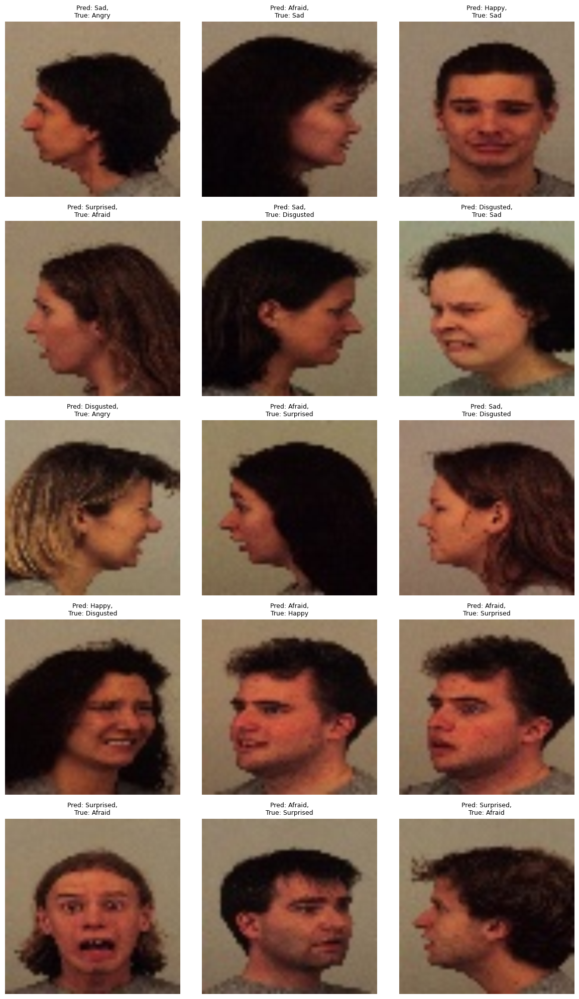




------------------------------------
 Accuracies  [0.8877551020408164, 0.9142857142857144, 0.8959183673469389]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.73it/s]


train Loss: 1.7090 Acc: 0.3052


100%|██████████| 16/16 [00:00<00:00, 17.11it/s]


val Loss: 1.2507 Acc: 0.4857

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.8837 Acc: 0.6717


100%|██████████| 16/16 [00:00<00:00, 16.61it/s]


val Loss: 0.7092 Acc: 0.7469

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.04it/s]


train Loss: 0.5396 Acc: 0.8020


100%|██████████| 16/16 [00:00<00:00, 17.20it/s]


val Loss: 0.8119 Acc: 0.7265

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.94it/s]


train Loss: 0.3592 Acc: 0.8735


100%|██████████| 16/16 [00:00<00:00, 17.18it/s]


val Loss: 0.4952 Acc: 0.8327

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.01it/s]


train Loss: 0.2379 Acc: 0.9238


100%|██████████| 16/16 [00:00<00:00, 16.97it/s]


val Loss: 0.4422 Acc: 0.8429

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.94it/s]


train Loss: 0.1265 Acc: 0.9649


100%|██████████| 16/16 [00:00<00:00, 17.01it/s]


val Loss: 0.3644 Acc: 0.8776

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.07it/s]


train Loss: 0.1135 Acc: 0.9692


100%|██████████| 16/16 [00:01<00:00, 15.73it/s]


val Loss: 0.3544 Acc: 0.8776

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.98it/s]


train Loss: 0.1036 Acc: 0.9730


100%|██████████| 16/16 [00:00<00:00, 16.99it/s]


val Loss: 0.3565 Acc: 0.8776

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.97it/s]


train Loss: 0.0782 Acc: 0.9819


100%|██████████| 16/16 [00:00<00:00, 16.32it/s]


val Loss: 0.3386 Acc: 0.8837

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.01it/s]


train Loss: 0.0705 Acc: 0.9859


100%|██████████| 16/16 [00:00<00:00, 16.22it/s]


val Loss: 0.3374 Acc: 0.8878

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.01it/s]


train Loss: 0.0658 Acc: 0.9873


100%|██████████| 16/16 [00:00<00:00, 16.27it/s]


val Loss: 0.3327 Acc: 0.9020

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.94it/s]


train Loss: 0.0603 Acc: 0.9891


100%|██████████| 16/16 [00:00<00:00, 16.78it/s]


val Loss: 0.3255 Acc: 0.9000

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.87it/s]


train Loss: 0.0610 Acc: 0.9896


100%|██████████| 16/16 [00:00<00:00, 16.45it/s]


val Loss: 0.3344 Acc: 0.9000

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.05it/s]


train Loss: 0.0611 Acc: 0.9868


100%|██████████| 16/16 [00:00<00:00, 16.82it/s]


val Loss: 0.3296 Acc: 0.9000

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.98it/s]


train Loss: 0.0627 Acc: 0.9878


100%|██████████| 16/16 [00:00<00:00, 16.63it/s]


val Loss: 0.3334 Acc: 0.8939

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.06it/s]


train Loss: 0.0569 Acc: 0.9887


100%|██████████| 16/16 [00:00<00:00, 16.43it/s]


val Loss: 0.3362 Acc: 0.8980

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.93it/s]


train Loss: 0.0568 Acc: 0.9905


100%|██████████| 16/16 [00:00<00:00, 16.59it/s]


val Loss: 0.3197 Acc: 0.8918

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.0592 Acc: 0.9893


100%|██████████| 16/16 [00:00<00:00, 17.17it/s]


val Loss: 0.3517 Acc: 0.8959

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.94it/s]


train Loss: 0.0548 Acc: 0.9909


100%|██████████| 16/16 [00:00<00:00, 16.06it/s]


val Loss: 0.3347 Acc: 0.8939

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.89it/s]


train Loss: 0.0590 Acc: 0.9887


100%|██████████| 16/16 [00:01<00:00, 15.65it/s]


val Loss: 0.3405 Acc: 0.8939

Training complete in 4m 33s
Best val Acc: 0.902041
Showing misclassified examples for fold 3...


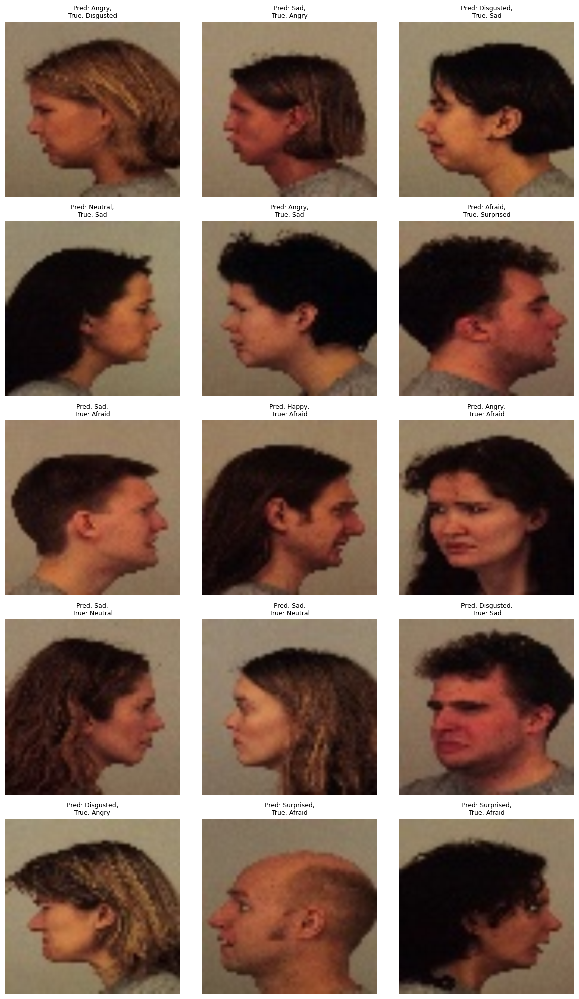




------------------------------------
 Accuracies  [0.8877551020408164, 0.9142857142857144, 0.8959183673469389, 0.9020408163265307]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.87it/s]


train Loss: 1.7112 Acc: 0.3211


100%|██████████| 16/16 [00:00<00:00, 16.12it/s]


val Loss: 1.3056 Acc: 0.5041

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.93it/s]


train Loss: 0.8982 Acc: 0.6687


100%|██████████| 16/16 [00:00<00:00, 17.12it/s]


val Loss: 0.8198 Acc: 0.6714

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.94it/s]


train Loss: 0.5443 Acc: 0.8020


100%|██████████| 16/16 [00:00<00:00, 17.37it/s]


val Loss: 0.9860 Acc: 0.6837

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.04it/s]


train Loss: 0.3662 Acc: 0.8692


100%|██████████| 16/16 [00:00<00:00, 17.02it/s]


val Loss: 0.6057 Acc: 0.7816

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.98it/s]


train Loss: 0.2693 Acc: 0.9059


100%|██████████| 16/16 [00:00<00:00, 17.37it/s]


val Loss: 0.5283 Acc: 0.8041

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.1482 Acc: 0.9556


100%|██████████| 16/16 [00:01<00:00, 15.31it/s]


val Loss: 0.4392 Acc: 0.8306

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.1125 Acc: 0.9735


100%|██████████| 16/16 [00:00<00:00, 17.35it/s]


val Loss: 0.4207 Acc: 0.8388

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.02it/s]


train Loss: 0.0976 Acc: 0.9785


100%|██████████| 16/16 [00:01<00:00, 15.27it/s]


val Loss: 0.4178 Acc: 0.8469

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.06it/s]


train Loss: 0.0883 Acc: 0.9776


100%|██████████| 16/16 [00:01<00:00, 15.94it/s]


val Loss: 0.4077 Acc: 0.8490

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.02it/s]


train Loss: 0.0823 Acc: 0.9816


100%|██████████| 16/16 [00:00<00:00, 16.88it/s]


val Loss: 0.4129 Acc: 0.8510

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.93it/s]


train Loss: 0.0747 Acc: 0.9844


100%|██████████| 16/16 [00:01<00:00, 15.68it/s]


val Loss: 0.4071 Acc: 0.8510

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.02it/s]


train Loss: 0.0695 Acc: 0.9819


100%|██████████| 16/16 [00:00<00:00, 17.19it/s]


val Loss: 0.4043 Acc: 0.8531

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.00it/s]


train Loss: 0.0613 Acc: 0.9882


100%|██████████| 16/16 [00:00<00:00, 16.32it/s]


val Loss: 0.4043 Acc: 0.8571

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.06it/s]


train Loss: 0.0590 Acc: 0.9909


100%|██████████| 16/16 [00:00<00:00, 17.19it/s]


val Loss: 0.4005 Acc: 0.8490

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.0619 Acc: 0.9868


100%|██████████| 16/16 [00:00<00:00, 16.72it/s]


val Loss: 0.4069 Acc: 0.8592

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.92it/s]


train Loss: 0.0662 Acc: 0.9859


100%|██████████| 16/16 [00:00<00:00, 16.34it/s]


val Loss: 0.4074 Acc: 0.8592

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.01it/s]


train Loss: 0.0583 Acc: 0.9893


100%|██████████| 16/16 [00:00<00:00, 16.99it/s]


val Loss: 0.3950 Acc: 0.8571

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.06it/s]


train Loss: 0.0600 Acc: 0.9898


100%|██████████| 16/16 [00:00<00:00, 16.05it/s]


val Loss: 0.4024 Acc: 0.8571

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.0595 Acc: 0.9891


100%|██████████| 16/16 [00:00<00:00, 17.24it/s]


val Loss: 0.4038 Acc: 0.8551

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.0583 Acc: 0.9893


100%|██████████| 16/16 [00:00<00:00, 16.54it/s]


val Loss: 0.4104 Acc: 0.8571

Training complete in 4m 34s
Best val Acc: 0.859184
Showing misclassified examples for fold 4...


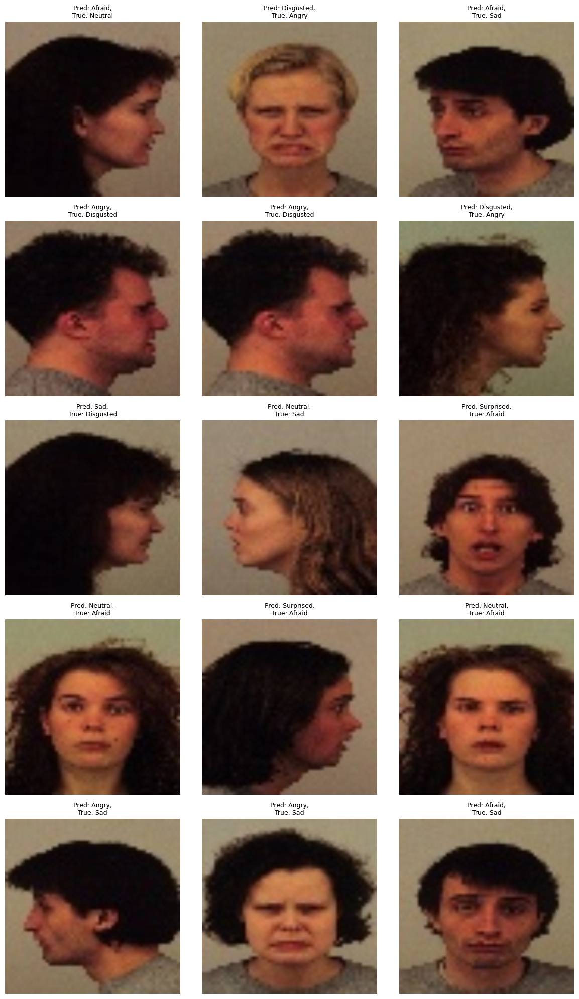




------------------------------------
 Accuracies  [0.8877551020408164, 0.9142857142857144, 0.8959183673469389, 0.9020408163265307, 0.8591836734693878]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.00it/s]


train Loss: 1.6941 Acc: 0.3283


100%|██████████| 16/16 [00:01<00:00, 15.15it/s]


val Loss: 1.2819 Acc: 0.5082

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.97it/s]


train Loss: 0.8638 Acc: 0.6837


100%|██████████| 16/16 [00:00<00:00, 17.34it/s]


val Loss: 0.7681 Acc: 0.7020

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.86it/s]


train Loss: 0.4996 Acc: 0.8200


100%|██████████| 16/16 [00:00<00:00, 17.30it/s]


val Loss: 0.6200 Acc: 0.7755

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.92it/s]


train Loss: 0.3596 Acc: 0.8791


100%|██████████| 16/16 [00:01<00:00, 15.85it/s]


val Loss: 0.7712 Acc: 0.7286

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.87it/s]


train Loss: 0.2466 Acc: 0.9202


100%|██████████| 16/16 [00:00<00:00, 17.07it/s]


val Loss: 0.4463 Acc: 0.8469

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.93it/s]


train Loss: 0.1325 Acc: 0.9610


100%|██████████| 16/16 [00:00<00:00, 16.41it/s]


val Loss: 0.3426 Acc: 0.8755

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.89it/s]


train Loss: 0.1095 Acc: 0.9669


100%|██████████| 16/16 [00:00<00:00, 17.07it/s]


val Loss: 0.3213 Acc: 0.8857

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.0866 Acc: 0.9791


100%|██████████| 16/16 [00:00<00:00, 17.07it/s]


val Loss: 0.3265 Acc: 0.8857

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.91it/s]


train Loss: 0.0784 Acc: 0.9823


100%|██████████| 16/16 [00:00<00:00, 16.63it/s]


val Loss: 0.3285 Acc: 0.8776

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.91it/s]


train Loss: 0.0813 Acc: 0.9805


100%|██████████| 16/16 [00:00<00:00, 16.55it/s]


val Loss: 0.3367 Acc: 0.8796

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.98it/s]


train Loss: 0.0664 Acc: 0.9848


100%|██████████| 16/16 [00:00<00:00, 16.82it/s]


val Loss: 0.3506 Acc: 0.8776

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.88it/s]


train Loss: 0.0610 Acc: 0.9873


100%|██████████| 16/16 [00:00<00:00, 16.75it/s]


val Loss: 0.3315 Acc: 0.8837

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.69it/s]


train Loss: 0.0602 Acc: 0.9893


100%|██████████| 16/16 [00:00<00:00, 17.07it/s]


val Loss: 0.3336 Acc: 0.8898

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.0602 Acc: 0.9878


100%|██████████| 16/16 [00:01<00:00, 15.42it/s]


val Loss: 0.3236 Acc: 0.8959

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.91it/s]


train Loss: 0.0587 Acc: 0.9889


100%|██████████| 16/16 [00:00<00:00, 17.42it/s]


val Loss: 0.3233 Acc: 0.8898

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.86it/s]


train Loss: 0.0567 Acc: 0.9891


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.3278 Acc: 0.8898

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.78it/s]


train Loss: 0.0586 Acc: 0.9898


100%|██████████| 16/16 [00:01<00:00, 15.48it/s]


val Loss: 0.3333 Acc: 0.8878

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.04it/s]


train Loss: 0.0601 Acc: 0.9878


100%|██████████| 16/16 [00:00<00:00, 17.08it/s]


val Loss: 0.3438 Acc: 0.8878

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.11it/s]


train Loss: 0.0582 Acc: 0.9887


100%|██████████| 16/16 [00:00<00:00, 16.57it/s]


val Loss: 0.3224 Acc: 0.8918

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.74it/s]


train Loss: 0.0586 Acc: 0.9896


100%|██████████| 16/16 [00:00<00:00, 16.19it/s]


val Loss: 0.3109 Acc: 0.8918

Training complete in 4m 35s
Best val Acc: 0.895918
Showing misclassified examples for fold 5...


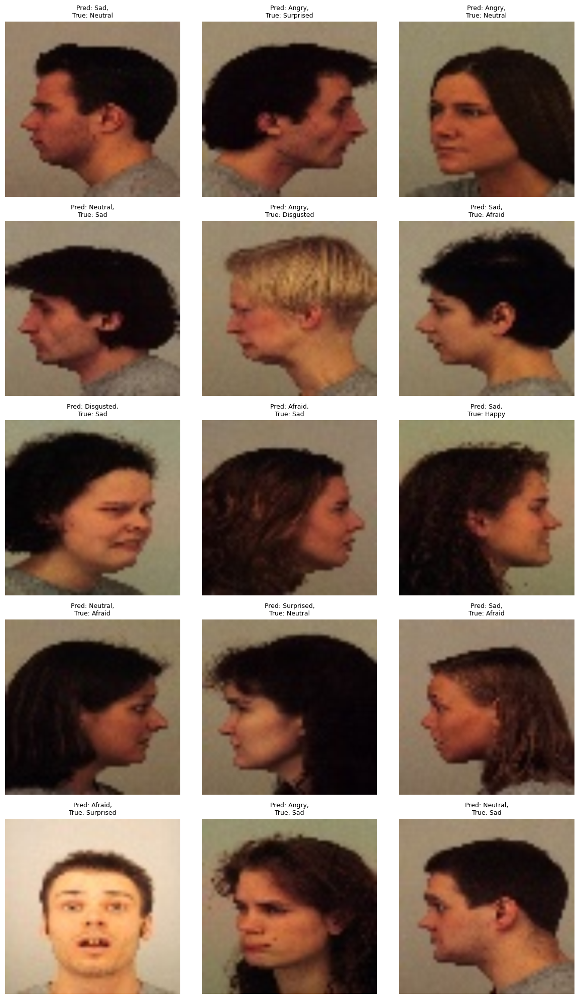




------------------------------------
 Accuracies  [0.8877551020408164, 0.9142857142857144, 0.8959183673469389, 0.9020408163265307, 0.8591836734693878, 0.8959183673469389]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.93it/s]


train Loss: 1.7686 Acc: 0.2848


100%|██████████| 16/16 [00:00<00:00, 16.81it/s]


val Loss: 1.2748 Acc: 0.5469

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.03it/s]


train Loss: 0.9691 Acc: 0.6356


100%|██████████| 16/16 [00:00<00:00, 17.30it/s]


val Loss: 0.7005 Acc: 0.7347

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.89it/s]


train Loss: 0.5658 Acc: 0.7961


100%|██████████| 16/16 [00:00<00:00, 17.26it/s]


val Loss: 0.6428 Acc: 0.7490

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.01it/s]


train Loss: 0.3751 Acc: 0.8673


100%|██████████| 16/16 [00:00<00:00, 16.47it/s]


val Loss: 0.5933 Acc: 0.7653

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.00it/s]


train Loss: 0.2540 Acc: 0.9150


100%|██████████| 16/16 [00:00<00:00, 17.01it/s]


val Loss: 0.4792 Acc: 0.8327

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.86it/s]


train Loss: 0.1631 Acc: 0.9499


100%|██████████| 16/16 [00:01<00:00, 15.85it/s]


val Loss: 0.3294 Acc: 0.8755

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.1126 Acc: 0.9701


100%|██████████| 16/16 [00:00<00:00, 16.64it/s]


val Loss: 0.3196 Acc: 0.8653

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.78it/s]


train Loss: 0.0992 Acc: 0.9751


100%|██████████| 16/16 [00:00<00:00, 16.19it/s]


val Loss: 0.3010 Acc: 0.8918

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.77it/s]


train Loss: 0.0863 Acc: 0.9807


100%|██████████| 16/16 [00:00<00:00, 17.45it/s]


val Loss: 0.3130 Acc: 0.8898

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.95it/s]


train Loss: 0.0835 Acc: 0.9807


100%|██████████| 16/16 [00:00<00:00, 17.27it/s]


val Loss: 0.3126 Acc: 0.8878

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.86it/s]


train Loss: 0.0713 Acc: 0.9844


100%|██████████| 16/16 [00:01<00:00, 15.45it/s]


val Loss: 0.3229 Acc: 0.8878

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.73it/s]


train Loss: 0.0687 Acc: 0.9875


100%|██████████| 16/16 [00:00<00:00, 16.05it/s]


val Loss: 0.3161 Acc: 0.8898

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.88it/s]


train Loss: 0.0660 Acc: 0.9873


100%|██████████| 16/16 [00:00<00:00, 16.17it/s]


val Loss: 0.3098 Acc: 0.8939

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.95it/s]


train Loss: 0.0642 Acc: 0.9871


100%|██████████| 16/16 [00:00<00:00, 16.79it/s]


val Loss: 0.3076 Acc: 0.8939

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.90it/s]


train Loss: 0.0612 Acc: 0.9891


100%|██████████| 16/16 [00:00<00:00, 16.39it/s]


val Loss: 0.3070 Acc: 0.8918

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.81it/s]


train Loss: 0.0642 Acc: 0.9862


100%|██████████| 16/16 [00:00<00:00, 17.07it/s]


val Loss: 0.3278 Acc: 0.8816

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.90it/s]


train Loss: 0.0581 Acc: 0.9902


100%|██████████| 16/16 [00:00<00:00, 16.45it/s]


val Loss: 0.3130 Acc: 0.8878

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.94it/s]


train Loss: 0.0595 Acc: 0.9893


100%|██████████| 16/16 [00:00<00:00, 16.03it/s]


val Loss: 0.3141 Acc: 0.8939

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.69it/s]


train Loss: 0.0653 Acc: 0.9857


100%|██████████| 16/16 [00:00<00:00, 17.35it/s]


val Loss: 0.2981 Acc: 0.8939

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.0632 Acc: 0.9878


100%|██████████| 16/16 [00:00<00:00, 16.63it/s]


val Loss: 0.3014 Acc: 0.8898

Training complete in 4m 35s
Best val Acc: 0.893878
Showing misclassified examples for fold 6...


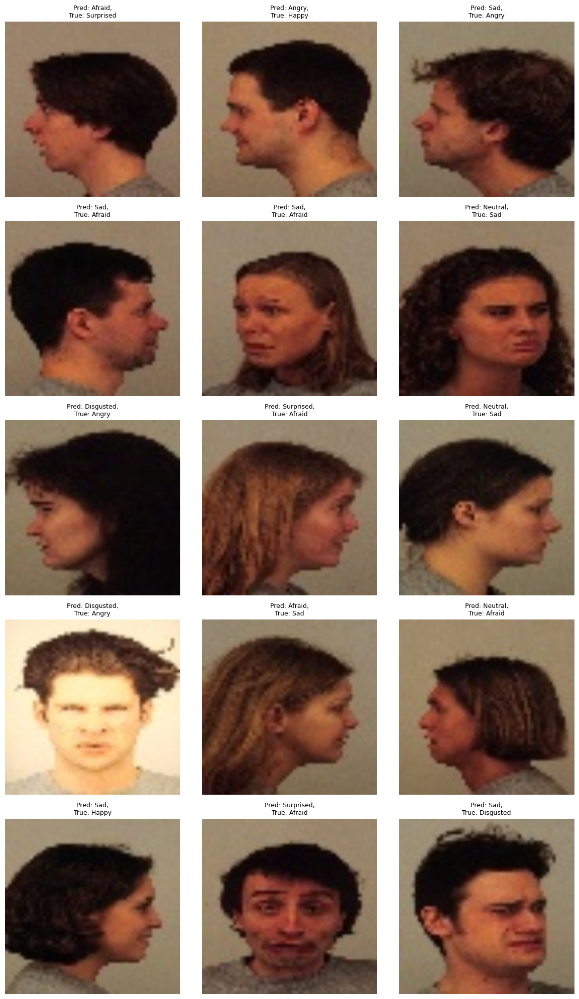




------------------------------------
 Accuracies  [0.8877551020408164, 0.9142857142857144, 0.8959183673469389, 0.9020408163265307, 0.8591836734693878, 0.8959183673469389, 0.8938775510204082]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.80it/s]


train Loss: 1.7240 Acc: 0.3098


100%|██████████| 16/16 [00:00<00:00, 17.07it/s]


val Loss: 1.1964 Acc: 0.5224

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.98it/s]


train Loss: 0.8686 Acc: 0.6771


100%|██████████| 16/16 [00:00<00:00, 16.49it/s]


val Loss: 0.8930 Acc: 0.6551

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.97it/s]


train Loss: 0.5298 Acc: 0.8100


100%|██████████| 16/16 [00:00<00:00, 17.34it/s]


val Loss: 0.7010 Acc: 0.7449

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.86it/s]


train Loss: 0.3586 Acc: 0.8735


100%|██████████| 16/16 [00:00<00:00, 17.17it/s]


val Loss: 0.5202 Acc: 0.8204

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.66it/s]


train Loss: 0.2316 Acc: 0.9215


100%|██████████| 16/16 [00:00<00:00, 17.26it/s]


val Loss: 0.5020 Acc: 0.8020

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.81it/s]


train Loss: 0.1495 Acc: 0.9531


100%|██████████| 16/16 [00:00<00:00, 16.32it/s]


val Loss: 0.3727 Acc: 0.8673

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.98it/s]


train Loss: 0.1133 Acc: 0.9710


100%|██████████| 16/16 [00:00<00:00, 17.31it/s]


val Loss: 0.3593 Acc: 0.8633

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.79it/s]


train Loss: 0.0939 Acc: 0.9766


100%|██████████| 16/16 [00:01<00:00, 15.79it/s]


val Loss: 0.3584 Acc: 0.8735

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.91it/s]


train Loss: 0.0895 Acc: 0.9766


100%|██████████| 16/16 [00:00<00:00, 16.60it/s]


val Loss: 0.3498 Acc: 0.8796

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.85it/s]


train Loss: 0.0752 Acc: 0.9823


100%|██████████| 16/16 [00:00<00:00, 17.24it/s]


val Loss: 0.3435 Acc: 0.8673

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.0705 Acc: 0.9837


100%|██████████| 16/16 [00:01<00:00, 15.58it/s]


val Loss: 0.3512 Acc: 0.8694

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.88it/s]


train Loss: 0.0589 Acc: 0.9889


100%|██████████| 16/16 [00:01<00:00, 15.80it/s]


val Loss: 0.3445 Acc: 0.8633

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.76it/s]


train Loss: 0.0624 Acc: 0.9873


100%|██████████| 16/16 [00:00<00:00, 16.45it/s]


val Loss: 0.3388 Acc: 0.8714

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.76it/s]


train Loss: 0.0577 Acc: 0.9868


100%|██████████| 16/16 [00:00<00:00, 16.54it/s]


val Loss: 0.3320 Acc: 0.8694

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.94it/s]


train Loss: 0.0608 Acc: 0.9887


100%|██████████| 16/16 [00:00<00:00, 17.05it/s]


val Loss: 0.3438 Acc: 0.8673

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.95it/s]


train Loss: 0.0592 Acc: 0.9880


100%|██████████| 16/16 [00:00<00:00, 17.18it/s]


val Loss: 0.3405 Acc: 0.8694

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.95it/s]


train Loss: 0.0605 Acc: 0.9887


100%|██████████| 16/16 [00:01<00:00, 15.81it/s]


val Loss: 0.3416 Acc: 0.8755

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.85it/s]


train Loss: 0.0551 Acc: 0.9902


100%|██████████| 16/16 [00:00<00:00, 17.14it/s]


val Loss: 0.3637 Acc: 0.8592

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.93it/s]


train Loss: 0.0595 Acc: 0.9873


100%|██████████| 16/16 [00:00<00:00, 16.97it/s]


val Loss: 0.3369 Acc: 0.8816

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.03it/s]


train Loss: 0.0561 Acc: 0.9889


100%|██████████| 16/16 [00:00<00:00, 17.34it/s]


val Loss: 0.3423 Acc: 0.8714

Training complete in 4m 35s
Best val Acc: 0.881633
Showing misclassified examples for fold 7...


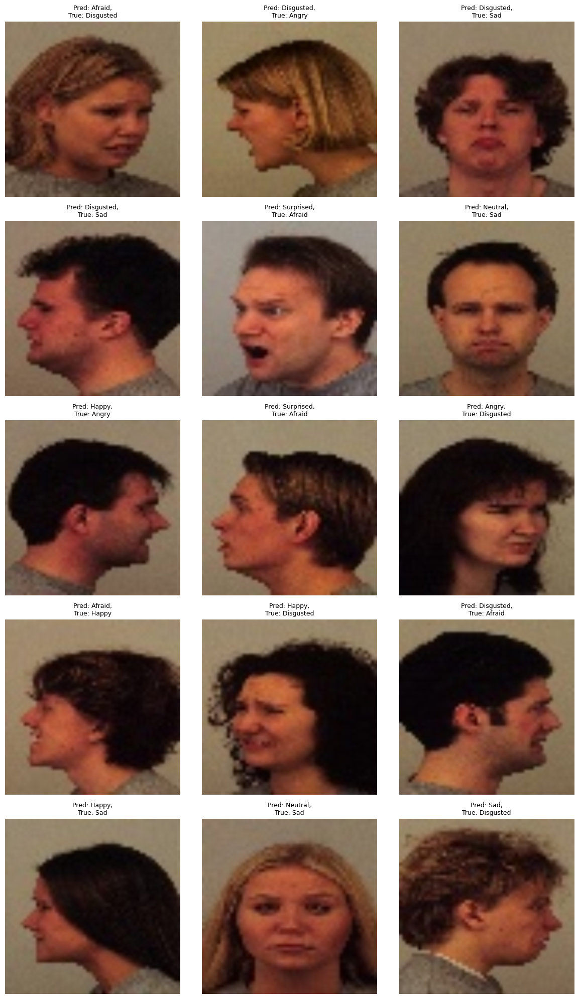




------------------------------------
 Accuracies  [0.8877551020408164, 0.9142857142857144, 0.8959183673469389, 0.9020408163265307, 0.8591836734693878, 0.8959183673469389, 0.8938775510204082, 0.8816326530612246]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.87it/s]


train Loss: 1.7144 Acc: 0.3168


100%|██████████| 16/16 [00:00<00:00, 16.90it/s]


val Loss: 1.1265 Acc: 0.5776

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.95it/s]


train Loss: 0.9108 Acc: 0.6639


100%|██████████| 16/16 [00:00<00:00, 16.89it/s]


val Loss: 0.8150 Acc: 0.6837

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.90it/s]


train Loss: 0.5627 Acc: 0.8048


100%|██████████| 16/16 [00:00<00:00, 17.15it/s]


val Loss: 0.5624 Acc: 0.7878

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.94it/s]


train Loss: 0.3779 Acc: 0.8687


100%|██████████| 16/16 [00:00<00:00, 16.65it/s]


val Loss: 0.5410 Acc: 0.7837

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.92it/s]


train Loss: 0.2576 Acc: 0.9136


100%|██████████| 16/16 [00:00<00:00, 16.13it/s]


val Loss: 0.4620 Acc: 0.8327

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.90it/s]


train Loss: 0.1527 Acc: 0.9587


100%|██████████| 16/16 [00:01<00:00, 15.56it/s]


val Loss: 0.3870 Acc: 0.8551

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.87it/s]


train Loss: 0.1152 Acc: 0.9698


100%|██████████| 16/16 [00:00<00:00, 17.22it/s]


val Loss: 0.3521 Acc: 0.8673

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.0976 Acc: 0.9760


100%|██████████| 16/16 [00:00<00:00, 16.32it/s]


val Loss: 0.3762 Acc: 0.8571

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.94it/s]


train Loss: 0.0892 Acc: 0.9791


100%|██████████| 16/16 [00:00<00:00, 17.19it/s]


val Loss: 0.3685 Acc: 0.8653

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.0760 Acc: 0.9848


100%|██████████| 16/16 [00:00<00:00, 17.44it/s]


val Loss: 0.3547 Acc: 0.8673

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.89it/s]


train Loss: 0.0674 Acc: 0.9868


100%|██████████| 16/16 [00:00<00:00, 16.24it/s]


val Loss: 0.3533 Acc: 0.8755

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.80it/s]


train Loss: 0.0636 Acc: 0.9884


100%|██████████| 16/16 [00:00<00:00, 17.22it/s]


val Loss: 0.3590 Acc: 0.8755

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.92it/s]


train Loss: 0.0676 Acc: 0.9848


100%|██████████| 16/16 [00:00<00:00, 17.09it/s]


val Loss: 0.3579 Acc: 0.8735

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.79it/s]


train Loss: 0.0641 Acc: 0.9864


100%|██████████| 16/16 [00:00<00:00, 16.06it/s]


val Loss: 0.3521 Acc: 0.8653

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.0602 Acc: 0.9887


100%|██████████| 16/16 [00:00<00:00, 17.21it/s]


val Loss: 0.3542 Acc: 0.8694

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.96it/s]


train Loss: 0.0613 Acc: 0.9882


100%|██████████| 16/16 [00:00<00:00, 16.40it/s]


val Loss: 0.3590 Acc: 0.8694

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.97it/s]


train Loss: 0.0607 Acc: 0.9859


100%|██████████| 16/16 [00:00<00:00, 16.32it/s]


val Loss: 0.3470 Acc: 0.8673

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.66it/s]


train Loss: 0.0622 Acc: 0.9857


100%|██████████| 16/16 [00:00<00:00, 16.47it/s]


val Loss: 0.3434 Acc: 0.8776

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.84it/s]


train Loss: 0.0626 Acc: 0.9884


100%|██████████| 16/16 [00:01<00:00, 15.55it/s]


val Loss: 0.3520 Acc: 0.8673

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.94it/s]


train Loss: 0.0601 Acc: 0.9880


100%|██████████| 16/16 [00:00<00:00, 16.76it/s]


val Loss: 0.3572 Acc: 0.8673

Training complete in 4m 35s
Best val Acc: 0.877551
Showing misclassified examples for fold 8...


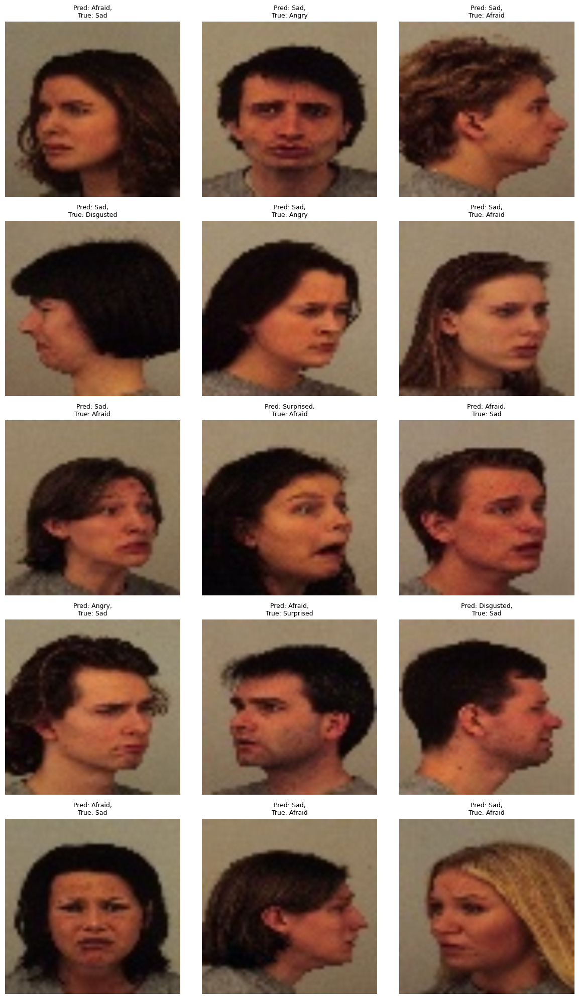




------------------------------------
 Accuracies  [0.8877551020408164, 0.9142857142857144, 0.8959183673469389, 0.9020408163265307, 0.8591836734693878, 0.8959183673469389, 0.8938775510204082, 0.8816326530612246, 0.8775510204081634]



Epoch 0/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.82it/s]


train Loss: 1.7258 Acc: 0.3070


100%|██████████| 16/16 [00:01<00:00, 15.83it/s]


val Loss: 1.1428 Acc: 0.5878

Epoch 1/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.69it/s]


train Loss: 0.9146 Acc: 0.6533


100%|██████████| 16/16 [00:00<00:00, 17.48it/s]


val Loss: 0.8027 Acc: 0.6816

Epoch 2/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.82it/s]


train Loss: 0.5525 Acc: 0.7934


100%|██████████| 16/16 [00:00<00:00, 16.82it/s]


val Loss: 0.6591 Acc: 0.7490

Epoch 3/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.90it/s]


train Loss: 0.3576 Acc: 0.8689


100%|██████████| 16/16 [00:00<00:00, 17.50it/s]


val Loss: 0.5229 Acc: 0.8102

Epoch 4/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.2416 Acc: 0.9179


100%|██████████| 16/16 [00:00<00:00, 16.98it/s]


val Loss: 0.5834 Acc: 0.7918

Epoch 5/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.86it/s]


train Loss: 0.1398 Acc: 0.9610


100%|██████████| 16/16 [00:00<00:00, 17.16it/s]


val Loss: 0.3656 Acc: 0.8673

Epoch 6/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.97it/s]


train Loss: 0.1158 Acc: 0.9658


100%|██████████| 16/16 [00:00<00:00, 17.34it/s]


val Loss: 0.3510 Acc: 0.8755

Epoch 7/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.92it/s]


train Loss: 0.0950 Acc: 0.9764


100%|██████████| 16/16 [00:00<00:00, 17.21it/s]


val Loss: 0.3630 Acc: 0.8735

Epoch 8/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.06it/s]


train Loss: 0.0805 Acc: 0.9830


100%|██████████| 16/16 [00:00<00:00, 17.13it/s]


val Loss: 0.3520 Acc: 0.8776

Epoch 9/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.92it/s]


train Loss: 0.0788 Acc: 0.9812


100%|██████████| 16/16 [00:00<00:00, 16.85it/s]


val Loss: 0.3533 Acc: 0.8816

Epoch 10/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.02it/s]


train Loss: 0.0731 Acc: 0.9828


100%|██████████| 16/16 [00:01<00:00, 15.57it/s]


val Loss: 0.3486 Acc: 0.8816

Epoch 11/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.95it/s]


train Loss: 0.0608 Acc: 0.9878


100%|██████████| 16/16 [00:00<00:00, 16.14it/s]


val Loss: 0.3506 Acc: 0.8816

Epoch 12/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.84it/s]


train Loss: 0.0657 Acc: 0.9859


100%|██████████| 16/16 [00:00<00:00, 17.25it/s]


val Loss: 0.3383 Acc: 0.8898

Epoch 13/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.0614 Acc: 0.9871


100%|██████████| 16/16 [00:00<00:00, 16.57it/s]


val Loss: 0.3532 Acc: 0.8857

Epoch 14/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.00it/s]


train Loss: 0.0669 Acc: 0.9880


100%|██████████| 16/16 [00:00<00:00, 16.40it/s]


val Loss: 0.3520 Acc: 0.8796

Epoch 15/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.99it/s]


train Loss: 0.0634 Acc: 0.9868


100%|██████████| 16/16 [00:00<00:00, 17.06it/s]


val Loss: 0.3569 Acc: 0.8776

Epoch 16/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.98it/s]


train Loss: 0.0571 Acc: 0.9884


100%|██████████| 16/16 [00:01<00:00, 15.51it/s]


val Loss: 0.3470 Acc: 0.8837

Epoch 17/19
----------


100%|██████████| 138/138 [00:12<00:00, 10.84it/s]


train Loss: 0.0576 Acc: 0.9884


100%|██████████| 16/16 [00:00<00:00, 17.42it/s]


val Loss: 0.3518 Acc: 0.8776

Epoch 18/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.04it/s]


train Loss: 0.0603 Acc: 0.9887


100%|██████████| 16/16 [00:00<00:00, 16.68it/s]


val Loss: 0.3518 Acc: 0.8816

Epoch 19/19
----------


100%|██████████| 138/138 [00:12<00:00, 11.05it/s]


train Loss: 0.0550 Acc: 0.9905


100%|██████████| 16/16 [00:00<00:00, 17.47it/s]


val Loss: 0.3641 Acc: 0.8816

Training complete in 4m 34s
Best val Acc: 0.889796
Showing misclassified examples for fold 9...


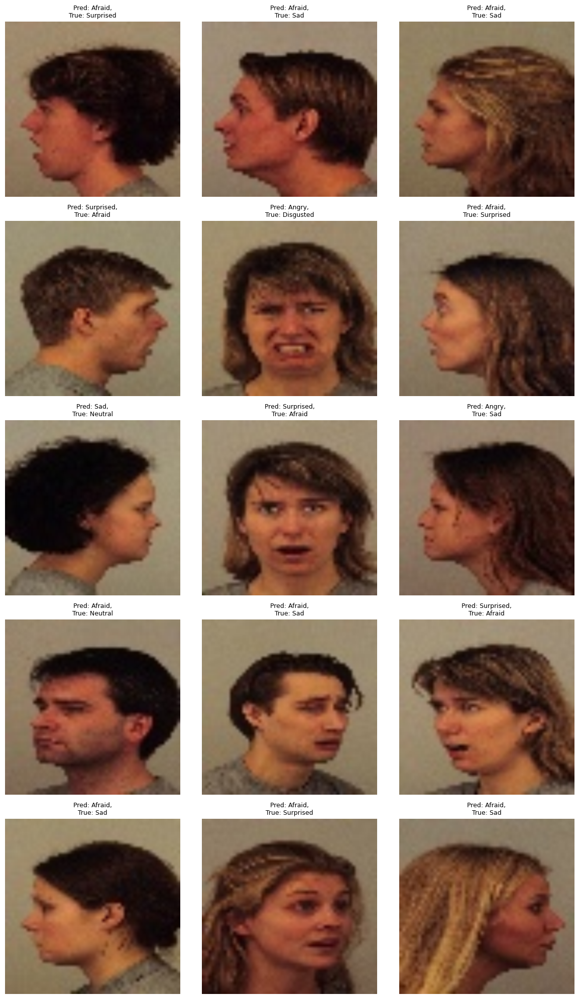




------------------------------------
 Accuracies  [0.8877551020408164, 0.9142857142857144, 0.8959183673469389, 0.9020408163265307, 0.8591836734693878, 0.8959183673469389, 0.8938775510204082, 0.8816326530612246, 0.8775510204081634, 0.8897959183673471]





In [14]:
accuracies = []
index = list(np.random.permutation(4900))

for i in range(10):
    idx = {
        'val': index[490 * i:490 * (i + 1)],
        'train': index[:i * 490] + index[((i + 1) * 490):]
    }

    dataloaders = {
        x: torch.utils.data.DataLoader(
            KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
            batch_size=32,
            shuffle=True
        )
        for x in ['train', 'val']
    }

    model_ft = models.resnet50(weights='IMAGENET1K_V1')
    num_ftrs = model_ft.fc.in_features
    model_ft.fc = nn.Linear(num_ftrs, class_names)
    model_ft = model_ft.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=6, gamma=0.1)

    logdir = f'./logs/resnet50_kfold_{i}'
    os.makedirs(logdir, exist_ok=True)  # Ensure logs dir exists
    writer = SummaryWriter(logdir)

    # 🛠️ ensure "saved" directory exists before saving the model
    os.makedirs('saved', exist_ok=True)

    model_ft, best_acc = train_model(
        model_ft,
        criterion,
        optimizer_ft,
        exp_lr_scheduler,
        dataloaders,
        writer,
        i,
        num_epochs=20
    )

    # Save model
    torch.save(model_ft.state_dict(), f'saved/model_fold_{i}.pt')

    print(f"Showing misclassified examples for fold {i}...")
    visualize_model_misclassified(
    model=model_ft,
    dataloader=dataloaders['val'],
    class_names={
        0: "Afraid", 1: "Angry", 2: "Disgusted",
        3: "Happy", 4: "Neutral", 5: "Sad", 6: "Surprised"
    },
    save_dir=f'misclassified/fold_{i}',
    num_images=15,

)

    accuracies.append(float(best_acc.cpu().numpy()))
    print("\n\n\n------------------------------------\n Accuracies ", accuracies)
    print("\n\n")



In [16]:
from google.colab import files

!zip -r resnet50_56x56_logs_and_saved_misclassified.zip logs saved misclassified
files.download('resnet50_56x56_logs_and_saved_misclassified.zip')

  adding: logs/ (stored 0%)
  adding: logs/resnet50_kfold_8/ (stored 0%)
  adding: logs/resnet50_kfold_8/events.out.tfevents.1744890033.f4f393fe97a5 (deflated 62%)
  adding: logs/resnet50_kfold_2/ (stored 0%)
  adding: logs/resnet50_kfold_2/events.out.tfevents.1744888368.f4f393fe97a5 (deflated 62%)
  adding: logs/resnet50_kfold_5/ (stored 0%)
  adding: logs/resnet50_kfold_5/events.out.tfevents.1744889198.f4f393fe97a5 (deflated 62%)
  adding: logs/resnet50_kfold_4/ (stored 0%)
  adding: logs/resnet50_kfold_4/events.out.tfevents.1744888921.f4f393fe97a5 (deflated 62%)
  adding: logs/resnet50_kfold_9/ (stored 0%)
  adding: logs/resnet50_kfold_9/events.out.tfevents.1744890312.f4f393fe97a5 (deflated 62%)
  adding: logs/resnet50_kfold_6/ (stored 0%)
  adding: logs/resnet50_kfold_6/events.out.tfevents.1744889477.f4f393fe97a5 (deflated 62%)
  adding: logs/resnet50_kfold_3/ (stored 0%)
  adding: logs/resnet50_kfold_3/events.out.tfevents.1744888644.f4f393fe97a5 (deflated 62%)
  adding: logs/resne

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>